## Libraries

In [1]:
import numpy as np
import pandas as pd

# We import the sk learn modules we'll need to segment our new data. We'll need scaler, pca and k-means.
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
# We import pickle in order to be able to load our pickled objects.
import pickle
# We import the Logistic Regression module from sk learn for the purchase probability model.
from sklearn.linear_model import LogisticRegression 
#We import the necessary libraries for visualization. We set seaborn do be our default.
import matplotlib.pyplot as plt
import matplotlib.axes as axs
import seaborn as sns
sns.set()
# We import the Linear Regression module from sk learn for the quantity model.
from sklearn.linear_model import LinearRegression

## Data Preparation

In [2]:
#load data
df_purchase = pd.read_csv('purchase data.csv')

# Import Scaler
scaler = pickle.load(open('scaler.pickle', 'rb'))
# Import PCA
pca = pickle.load(open('pca.pickle', 'rb'))
# Import K-Means
kmeans_pca = pickle.load(open('kmeans_pca.pickle', 'rb'))
# Standardization
features = df_purchase[['Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']]
df_purchase_segm_std = scaler.transform(features)
# Apply PCA
df_purchase_segm_pca = pca.transform(df_purchase_segm_std)
# Segment data
purchase_segm_kmeans_pca = kmeans_pca.predict(df_purchase_segm_pca)

# Create a copy of the data frame
df_purchase_predictors = df_purchase.copy()
# Add segment labels
df_purchase_predictors['Segment'] = purchase_segm_kmeans_pca
segment_dummies = pd.get_dummies(purchase_segm_kmeans_pca, prefix = 'Segment', prefix_sep = '_')
df_purchase_predictors = pd.concat([df_purchase_predictors, segment_dummies], axis = 1)

df_pa = df_purchase_predictors

## Purchase Probability Model

In [3]:
# In order to predict we need input and output variables. 
# Our Y is Incidence, as we want to predict the purchase probability for our customers
Y = df_pa['Incidence']

In [4]:
# Our dependant variable is based on the average price of chocolate candy bars. 
# Therefore, X is a data frame, containing the mean across the five prices.
X = pd.DataFrame()
X['Mean_Price'] = (df_pa['Price_1'] +
                   df_pa['Price_2'] +
                   df_pa['Price_3'] +
                   df_pa['Price_4'] +
                   df_pa['Price_5'] ) / 5

In [5]:
# We create a Logistic Regression model using sk learn. Then we fit the model with our X or price and our Y or incidence.
model_purchase = LogisticRegression(solver = 'sag')
model_purchase.fit(X, Y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [6]:
# The coefficients for price. It is negative, signaling that with an increase in price, the purchase probability decreases.
model_purchase.coef_

array([[-2.34795993]])

# PRICE ELASTICITY OF PURCHASE PROBABILITY

In [7]:
#We already have info about change in purch probability givn a price thats what log reg coeff is showing threfore we want 
# to check dff vals fr mean price and see how thet effect purc prob... we can use a range from min to max...use des method 
# to get it
df_pa[["Price_1" , 'Price_2' , 'Price_3' , 'Price_4' ,  'Price_5']].describe()

,Price_1,Price_2,Price_3,Price_4,Price_5
count,58693.000000,58693.000000,58693.000000,58693.000000,58693.000000
mean,1.392074,1.780999,2.006789,2.159945,2.654798
std,0.091139,0.170868,0.046867,0.089825,0.098272
min,1.100000,1.260000,1.870000,1.760000,2.110000
25%,1.340000,1.580000,1.970000,2.120000,2.630000
50%,1.390000,1.880000,2.010000,2.170000,2.670000
75%,1.470000,1.890000,2.060000,2.240000,2.700000
max,1.590000,1.900000,2.140000,2.260000,2.800000


In [8]:
# we will use range 0.5 and 3.5..
price_range = np.arange(0.5 , 3.5, 0.01)
price_range

array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
       0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
       0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
       0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93,
       0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1.  , 1.01, 1.02, 1.03, 1.04,
       1.05, 1.06, 1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.14, 1.15,
       1.16, 1.17, 1.18, 1.19, 1.2 , 1.21, 1.22, 1.23, 1.24, 1.25, 1.26,
       1.27, 1.28, 1.29, 1.3 , 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37,
       1.38, 1.39, 1.4 , 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48,
       1.49, 1.5 , 1.51, 1.52, 1.53, 1.54, 1.55, 1.56, 1.57, 1.58, 1.59,
       1.6 , 1.61, 1.62, 1.63, 1.64, 1.65, 1.66, 1.67, 1.68, 1.69, 1.7 ,
       1.71, 1.72, 1.73, 1.74, 1.75, 1.76, 1.77, 1.78, 1.79, 1.8 , 1.81,
       1.82, 1.83, 1.84, 1.85, 1.86, 1.87, 1.88, 1.89, 1.9 , 1.91, 1.92,
       1.93, 1.94, 1.95, 1.96, 1.97, 1.98, 1.99, 2.

In [97]:
# we have gen 300 diff price vals above..store this in new df
df_price_range = pd.DataFrame(price_range)
df_price_range
# thats all we need to predict the prob of each row

,0
0,0.50
1,0.51
2,0.52
3,0.53
4,0.54
5,0.55
6,0.56
7,0.57
8,0.58
9,0.59


In [10]:
Y_Pr = model_purchase.predict_proba(df_price_range)

In [11]:
Y_Pr #we have obtained class prob for our 2 clases (0and1)... 0 means no purchase...1st val on a row shows prob of no purch
#  while the 2nd value in a row show prob of purchase...they add up to 1..we are only interested in urchar prob..

array([[0.08211013, 0.91788987],
       [0.08389719, 0.91610281],
       [0.08571952, 0.91428048],
       [0.08757764, 0.91242236],
       [0.08947211, 0.91052789],
       [0.09140344, 0.90859656],
       [0.09337219, 0.90662781],
       [0.0953789 , 0.9046211 ],
       [0.0974241 , 0.9025759 ],
       [0.09950832, 0.90049168],
       [0.10163212, 0.89836788],
       [0.10379602, 0.89620398],
       [0.10600055, 0.89399945],
       [0.10824626, 0.89175374],
       [0.11053365, 0.88946635],
       [0.11286327, 0.88713673],
       [0.11523562, 0.88476438],
       [0.11765123, 0.88234877],
       [0.1201106 , 0.8798894 ],
       [0.12261424, 0.87738576],
       [0.12516263, 0.87483737],
       [0.12775629, 0.87224371],
       [0.13039567, 0.86960433],
       [0.13308127, 0.86691873],
       [0.13581354, 0.86418646],
       [0.13859294, 0.86140706],
       [0.14141991, 0.85858009],
       [0.14429488, 0.85570512],
       [0.14721828, 0.85278172],
       [0.15019051, 0.84980949],
       [0.

In [12]:
# we can see that Purch proba(PP) is higher with low prices and vice versa
purchase_pr = Y_Pr[:][:,1]

In [13]:
#How does demand for the product change wiht the given change in price? cal elasticity.
# val of coef is in an arry that why we re slicing to get the val
pe = model_purchase.coef_[:,0] * price_range * (1 - purchase_pr)  # this is an arry containg PE at each price value

In [14]:
#Creat a master DF for all PEs from here on...first ad price range array to it
df_price_elasticities = pd.DataFrame(price_range)

In [15]:
df_price_elasticities = df_price_elasticities.rename(columns = {0 : "Price Point"})
df_price_elasticities["Mean_PE"] = pe
df_price_elasticities # PEs will help us find avg cust Purch Behavior

,Price Point,Mean_PE
0,0.50,-0.096396
1,0.51,-0.100463
2,0.52,-0.104658
3,0.53,-0.108983
4,0.54,-0.113442
...,...,...
295,3.45,-8.012553
296,3.46,-8.037802
297,3.47,-8.063017
298,3.48,-8.088197


In [16]:
pd.options.display.max_rows = None
df_price_elasticities

,Price Point,Mean_PE
0,0.50,-0.096396
1,0.51,-0.100463
2,0.52,-0.104658
3,0.53,-0.108983
4,0.54,-0.113442
5,0.55,-0.118036
6,0.56,-0.122771
7,0.57,-0.127649
8,0.58,-0.132674
9,0.59,-0.137849


Text(0.5, 1.0, 'Price Elasticity of purchase probability')

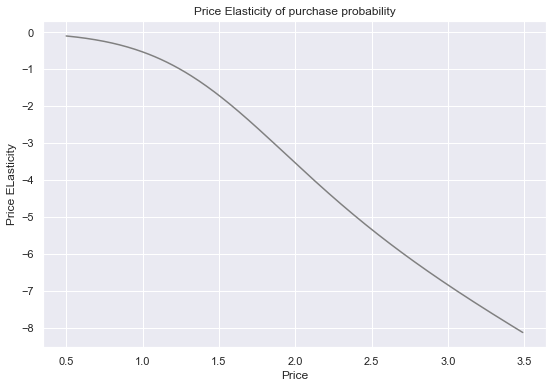

In [17]:
plt.figure(figsize= (9,6))
plt.plot(price_range,pe, color = 'grey')
plt.xlabel ('Price')
plt.ylabel('Price ELasticity')
plt.title("Price Elasticity of purchase probability")

In [18]:
#RESULTS FROM GRAPH ABOVE
# PE dec as price incs.. means more price,, ppl less likely buy it..
# at what rate this happens? slow at 0.5 till 1
#  all PE are negative coz coeff was negative, indicating iverse rela bet price and PE
# lets look at 1.0 price , the PE is -0.69..this means that for each incs in price by 1% the prob of purch wllchng by -0.69
# imp point is that the incs of 1% price cause less than 1% decs hence PP at this point is inelastic...we shud incs price
# take new ptts say (1.5) itll decs by (1.7) much bigger than prev... here PP is elastic hence we cant incs price,we decs it
# at point 1.25 we have max incsing point of our price....if we incs it furhter we loose PP

# PE by Segments
MODEL FOR CAREER FOCUSED

In [19]:
df_pa_segment_1 = df_pa[df_pa['Segment']== 1]

In [20]:
# we will do modelling for whic we need Y and X again
Y = df_pa_segment_1['Incidence']

In [21]:
# our feature (X) will be avg prince accross brands but for standard segmnt only
X = pd.DataFrame()

In [22]:
X['Mean_Price'] = (df_pa_segment_1['Price_1'] +
                   df_pa_segment_1['Price_2'] +
                   df_pa_segment_1['Price_3'] +
                   df_pa_segment_1['Price_4'] +
                   df_pa_segment_1['Price_5'] ) / 5

In [23]:
# creat model
model_incidence_segment_1 = LogisticRegression(solver = 'sag')
model_incidence_segment_1.fit(X,Y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [24]:
model_incidence_segment_1.coef_
# its lower in abs terms as comapred to the prev one therefore itll have low impact when we calc the elasticities

array([[-1.65228644]])

In [25]:
Y_segment_1 = model_incidence_segment_1.predict_proba(df_price_range)
purchase_pr_segment_1 = Y_segment_1[:][:,1]
pe_segment_1 = model_incidence_segment_1.coef_[:,0] * price_range * (1 - purchase_pr_segment_1)

In [26]:
df_price_elasticities['PE_Segment_1'] = pe_segment_1
df_price_elasticities
#in the table below creer foc becum inelastic at 1.43

,Price Point,Mean_PE,PE_Segment_1
0,0.50,-0.096396,-0.117620
1,0.51,-0.100463,-0.121683
2,0.52,-0.104658,-0.125833
3,0.53,-0.108983,-0.130072
4,0.54,-0.113442,-0.134402
5,0.55,-0.118036,-0.138823
6,0.56,-0.122771,-0.143337
7,0.57,-0.127649,-0.147946
8,0.58,-0.132674,-0.152650
9,0.59,-0.137849,-0.157451


Text(0.5, 1.0, 'Price Elasticity of purchase probability')

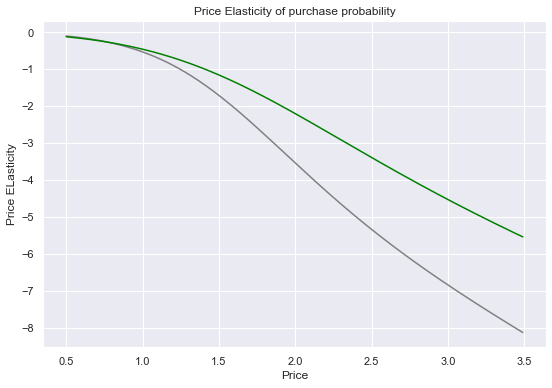

In [27]:
plt.figure(figsize= (9,6))
plt.plot(price_range,pe, color = 'grey')
plt.plot(price_range,pe_segment_1, color = 'green')
plt.xlabel ('Price')
plt.ylabel('Price ELasticity')
plt.title("Price Elasticity of purchase probability")

# SEGMENT 2: FEWER OPPUTUNITIES

In [28]:
df_pa_segment_2 = df_pa[df_pa['Segment']==2]
Y = df_pa_segment_2['Incidence']
X = pd.DataFrame()
X['Mean_Price'] = (df_pa_segment_2['Price_1'] +
                   df_pa_segment_2['Price_2'] +
                   df_pa_segment_2['Price_3'] +
                   df_pa_segment_2['Price_4'] +
                   df_pa_segment_2['Price_5'] ) / 5
model_incidence_segment_2 = LogisticRegression(solver = 'sag')
model_incidence_segment_2.fit(X,Y)
model_incidence_segment_2.coef_

Y_segment_2 = model_incidence_segment_2.predict_proba(df_price_range)
purchase_pr_segment_2 = Y_segment_2[:][:,1]
pe_segment_2 = model_incidence_segment_2.coef_[:,0] * price_range * (1 - purchase_pr_segment_2)

In [29]:
df_price_elasticities['PE_segment_2'] = pe_segment_2
df_price_elasticities

,Price Point,Mean_PE,PE_Segment_1,PE_segment_2
0,0.50,-0.096396,-0.117620,-0.032893
1,0.51,-0.100463,-0.121683,-0.034754
2,0.52,-0.104658,-0.125833,-0.036704
3,0.53,-0.108983,-0.130072,-0.038749
4,0.54,-0.113442,-0.134402,-0.040892
5,0.55,-0.118036,-0.138823,-0.043137
6,0.56,-0.122771,-0.143337,-0.045490
7,0.57,-0.127649,-0.147946,-0.047954
8,0.58,-0.132674,-0.152650,-0.050535
9,0.59,-0.137849,-0.157451,-0.053237


Text(0.5, 1.0, 'Price Elasticity of purchase probability')

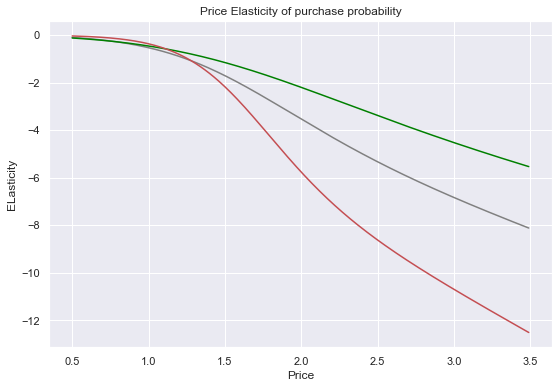

In [30]:
plt.figure(figsize= (9,6))
plt.plot(price_range,pe, color = 'grey')
plt.plot(price_range,pe_segment_1, color = 'green')
plt.plot(price_range,pe_segment_2, color = 'r')
plt.xlabel ('Price')
plt.ylabel('ELasticity')
plt.title("Price Elasticity of purchase probability")

# SEGMENT 3: STANDARD

In [31]:
df_pa_segment_3 = df_pa[df_pa['Segment']==3]
Y = df_pa_segment_3['Incidence']
X = pd.DataFrame()
X['Mean_Price'] = (df_pa_segment_3['Price_1'] +
                   df_pa_segment_3['Price_2'] +
                   df_pa_segment_3['Price_3'] +
                   df_pa_segment_3['Price_4'] +
                   df_pa_segment_3['Price_5'] ) / 5
model_incidence_segment_3 = LogisticRegression(solver = 'sag')
model_incidence_segment_3.fit(X,Y)
model_incidence_segment_3.coef_

Y_segment_3 = model_incidence_segment_3.predict_proba(df_price_range)
purchase_pr_segment_3 = Y_segment_3[:][:,1]
pe_segment_3 = model_incidence_segment_3.coef_[:,0] * price_range * (1 - purchase_pr_segment_3)

In [32]:
df_price_elasticities['PE_segment_3'] = pe_segment_3
df_price_elasticities

,Price Point,Mean_PE,PE_Segment_1,PE_segment_2,PE_segment_3
0,0.50,-0.096396,-0.117620,-0.032893,-0.220208
1,0.51,-0.100463,-0.121683,-0.034754,-0.227020
2,0.52,-0.104658,-0.125833,-0.036704,-0.233943
3,0.53,-0.108983,-0.130072,-0.038749,-0.240975
4,0.54,-0.113442,-0.134402,-0.040892,-0.248119
5,0.55,-0.118036,-0.138823,-0.043137,-0.255375
6,0.56,-0.122771,-0.143337,-0.045490,-0.262743
7,0.57,-0.127649,-0.147946,-0.047954,-0.270225
8,0.58,-0.132674,-0.152650,-0.050535,-0.277820
9,0.59,-0.137849,-0.157451,-0.053237,-0.285530


Text(0.5, 1.0, 'Price Elasticity of purchase probability')

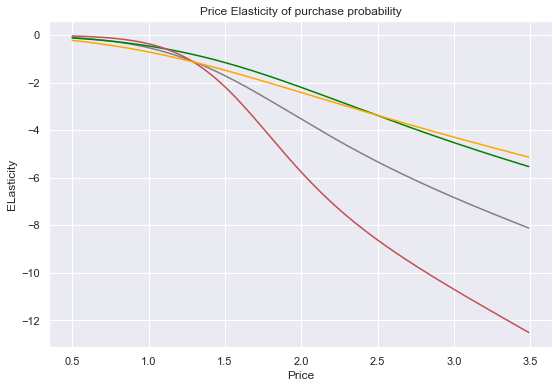

In [33]:
plt.figure(figsize= (9,6))
plt.plot(price_range,pe, color = 'grey')
plt.plot(price_range,pe_segment_1, color = 'green')
plt.plot(price_range,pe_segment_2, color = 'r')
plt.plot(price_range,pe_segment_3, color = 'orange')
plt.xlabel ('Price')
plt.ylabel('ELasticity')
plt.title("Price Elasticity of purchase probability")

# SEGMENT 4: WELL OFF

In [34]:
df_pa_segment_4 = df_pa[df_pa['Segment']==0]
Y = df_pa_segment_4['Incidence']
X = pd.DataFrame()
X['Mean_Price'] = (df_pa_segment_4['Price_1'] +
                   df_pa_segment_4['Price_2'] +
                   df_pa_segment_4['Price_3'] +
                   df_pa_segment_4['Price_4'] +
                   df_pa_segment_4['Price_5'] ) / 5
model_incidence_segment_4 = LogisticRegression(solver = 'sag')
model_incidence_segment_4.fit(X,Y)
model_incidence_segment_4.coef_

Y_segment_4 = model_incidence_segment_4.predict_proba(df_price_range)
purchase_pr_segment_4 = Y_segment_4[:][:,1]
pe_segment_4 = model_incidence_segment_4.coef_[:,0] * price_range * (1 - purchase_pr_segment_4)

In [35]:
df_price_elasticities['PE_segment_4'] = pe_segment_4
df_price_elasticities

,Price Point,Mean_PE,PE_Segment_1,PE_segment_2,PE_segment_3,PE_segment_4
0,0.50,-0.096396,-0.117620,-0.032893,-0.220208,-0.168011
1,0.51,-0.100463,-0.121683,-0.034754,-0.227020,-0.172934
2,0.52,-0.104658,-0.125833,-0.036704,-0.233943,-0.177928
3,0.53,-0.108983,-0.130072,-0.038749,-0.240975,-0.182993
4,0.54,-0.113442,-0.134402,-0.040892,-0.248119,-0.188129
5,0.55,-0.118036,-0.138823,-0.043137,-0.255375,-0.193337
6,0.56,-0.122771,-0.143337,-0.045490,-0.262743,-0.198617
7,0.57,-0.127649,-0.147946,-0.047954,-0.270225,-0.203969
8,0.58,-0.132674,-0.152650,-0.050535,-0.277820,-0.209395
9,0.59,-0.137849,-0.157451,-0.053237,-0.285530,-0.214894


Text(0.5, 1.0, 'Price Elasticity of purchase probability')

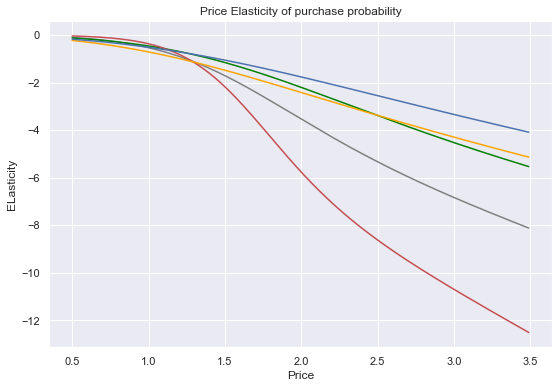

In [36]:
plt.figure(figsize= (9,6))
plt.plot(price_range,pe, color = 'grey')
plt.plot(price_range,pe_segment_1, color = 'green')
plt.plot(price_range,pe_segment_2, color = 'r')
plt.plot(price_range,pe_segment_3, color = 'orange')
plt.plot(price_range,pe_segment_4, color = 'b')
plt.xlabel ('Price')
plt.ylabel('ELasticity')
plt.title("Price Elasticity of purchase probability")

# Purchase probability with promotion feature : Data Preparation

In [37]:
# other than price we shud also take care of promotions coz itll affect PP..we will see its affect on Elasticity
#  thhs can be done segment wise but we are doing it for the whole dataset
Y = df_pa['Incidence']
X = pd.DataFrame()
X['Mean_Price'] = (df_pa['Price_1'] +
                   df_pa['Price_2'] +
                   df_pa['Price_3'] +
                   df_pa['Price_4'] +
                   df_pa['Price_5'] ) / 5

In [38]:
#now we will add promotion feature in X
#  we will calc mean promotion that is the avg promotion activities across all brands
X['Mean_Promotion'] = (df_pa['Promotion_1'] +
                       df_pa['Promotion_2'] +
                       df_pa['Promotion_3'] +
                       df_pa['Promotion_4'] +
                       df_pa['Promotion_5']) / 5
X

,Mean_Price,Mean_Promotion
0,2.044,0.2
1,2.028,0.0
2,2.028,0.0
3,2.028,0.0
4,2.030,0.0
5,2.028,0.0
6,2.030,0.0
7,2.030,0.0
8,1.932,0.6
9,1.932,0.6


# MODEL ESTIMATION

In [39]:
model_incidence_promotion = LogisticRegression(solver = 'sag')
model_incidence_promotion.fit(X,Y)
model_incidence_promotion.coef_
# [price , promotion] since pormotion coef is +ve it means with incs in promotio there wil be incs in PPPri

array([[-1.49403098,  0.56152887]])

# Price Elasticity with Promotion

In [40]:
# We create a data frame on which our model will predict. We need to include A price and promotion feature.
# First, we'll include the price range as the price feature. Next, we'll include the promotion feature.
df_price_elasticity_promotion = pd.DataFrame(price_range)
df_price_elasticity_promotion = df_price_elasticity_promotion.rename(columns = {0: "Price_Range"})

In [41]:
# We'll calculate price elasticities of purchase probability when we assume there is a promotion across at each price points.
df_price_elasticity_promotion['Promotion'] = 1

In [42]:
# Purchase Probability with Promotion Model Prediction
Y_promotion = model_incidence_promotion.predict_proba(df_price_elasticity_promotion)

In [43]:
promo = Y_promotion[:, 1]
price_elasticity_promo = (model_incidence_promotion.coef_[:, 0] * price_range) * (1 - promo)

In [44]:
# Update master data to include elasticities of purchase probability with promotion feature
df_price_elasticities['Elasticity_Promotion_1'] = price_elasticity_promo
df_price_elasticities

,Price Point,Mean_PE,PE_Segment_1,PE_segment_2,PE_segment_3,PE_segment_4,Elasticity_Promotion_1
0,0.50,-0.096396,-0.117620,-0.032893,-0.220208,-0.168011,-0.125724
1,0.51,-0.100463,-0.121683,-0.034754,-0.227020,-0.172934,-0.129840
2,0.52,-0.104658,-0.125833,-0.036704,-0.233943,-0.177928,-0.134035
3,0.53,-0.108983,-0.130072,-0.038749,-0.240975,-0.182993,-0.138310
4,0.54,-0.113442,-0.134402,-0.040892,-0.248119,-0.188129,-0.142665
5,0.55,-0.118036,-0.138823,-0.043137,-0.255375,-0.193337,-0.147103
6,0.56,-0.122771,-0.143337,-0.045490,-0.262743,-0.198617,-0.151624
7,0.57,-0.127649,-0.147946,-0.047954,-0.270225,-0.203969,-0.156228
8,0.58,-0.132674,-0.152650,-0.050535,-0.277820,-0.209395,-0.160917
9,0.59,-0.137849,-0.157451,-0.053237,-0.285530,-0.214894,-0.165693


# Price Elasticity without Promotion

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability with and without Promotion')

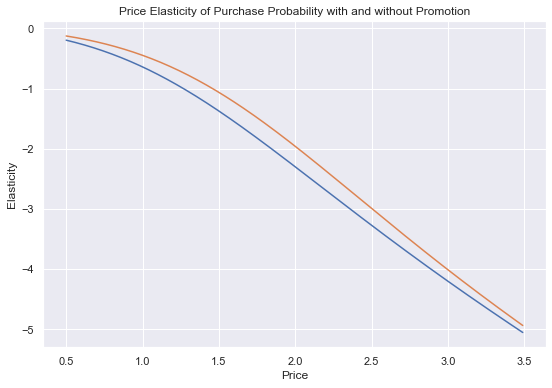

In [45]:
df_price_elasticity_promotion_no = pd.DataFrame(price_range)
df_price_elasticity_promotion_no = df_price_elasticity_promotion_no.rename(columns = {0: "Price_Range"})
# Promotion feature -No Promotion.
# We assume there aren't any promotional activities on any of the price points.
# We examine the elasticity of purchase probability when there isn't promotion.
df_price_elasticity_promotion_no['Promotion'] = 0
#Purchase Probability without Promotion Model Prediction
Y_no_promo = model_incidence_promotion.predict_proba(df_price_elasticity_promotion_no)
no_promo = Y_no_promo[: , 1]
price_elasticity_no_promo = model_incidence_promotion.coef_[:, 0] * price_range *(1- no_promo)
# Update master data frame to include purchase probability elasticities without promotion.
# We can now see the values with and without promotion and compare them for each price point in our price range.
df_price_elasticities['Elasticity_Promotion_0'] = price_elasticity_no_promo
# Plot purchase elasticities with and without promotion side by side for comprarisson.
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_no_promo)
plt.plot(price_range, price_elasticity_promo)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability with and without Promotion')

In [46]:
brand_choice = df_pa[df_pa['Incidence'] == 1]

In [47]:
pd.options.display.max_rows = 100
brand_choice

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,2,0,0,1,0
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,2,0,0,1,0
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,2,0,0,1,0
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,2,0,0,1,0
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,2,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58621,200000500,296,1,2,6,0,0,1.48,1.89,2.01,...,42,1,120946,1,0,2,0,0,1,0
58648,200000500,460,1,1,12,0,0,1.35,1.57,2.02,...,42,1,120946,1,0,2,0,0,1,0
58674,200000500,641,1,2,7,0,0,1.50,1.85,2.06,...,42,1,120946,1,0,2,0,0,1,0
58687,200000500,697,1,2,6,0,0,1.42,1.51,1.97,...,42,1,120946,1,0,2,0,0,1,0


In [48]:
Y = brand_choice["Brand"]

In [49]:
features = ['Price_1' ,'Price_2' , 'Price_3' , 'Price_4' , 'Price_5']
X= brand_choice[features]

In [50]:
model_brand_choice = LogisticRegression(solver = 'sag' , multi_class = "multinomial")
model_brand_choice.fit(X,Y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [51]:
model_brand_choice.coef_ # hard to understnad..its 5x5 coz we re doing muti classs. put this in df and label it

array([[-3.91595154,  0.6584634 ,  2.41773472,  0.70408694, -0.20210542],
       [ 1.27461164, -1.87985467, -0.21265002, -0.2063419 ,  0.58786944],
       [ 1.62418484,  0.56210364,  0.50088582,  1.03950877,  0.45278751],
       [ 0.57453572,  0.39558852, -1.40061495, -1.24624516,  0.24934873],
       [ 0.44261934,  0.2636991 , -1.30535556, -0.29100865, -1.08790027]])

In [52]:
bc_coef = pd.DataFrame(model_brand_choice.coef_)
bc_coef

,0,1,2,3,4
0,-3.915952,0.658463,2.417735,0.704087,-0.202105
1,1.274612,-1.879855,-0.212650,-0.206342,0.587869
2,1.624185,0.562104,0.500886,1.039509,0.452788
3,0.574536,0.395589,-1.400615,-1.246245,0.249349
4,0.442619,0.263699,-1.305356,-0.291009,-1.087900


In [53]:
#this wasnt very help....lets transpose it... we will have features as rows and opt vars as columns which is the conventional 
# way of representation.
bc_coef = pd.DataFrame(np.transpose(model_brand_choice.coef_))
coefficients = ['Coef_Brand_1' , 'Coef_Brand_2' ,'Coef_Brand_3' ,'Coef_Brand_4' , 'Coef_Brand_5']
bc_coef.columns  = [coefficients]
prices = ['Price_1' , 'Price_2' , 'Price_3' ,'Price_4' ,'Price_5']
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)
bc_coef

,Coef_Brand_1,Coef_Brand_2,Coef_Brand_3,Coef_Brand_4,Coef_Brand_5
Price_1,-3.92,1.27,1.62,0.57,0.44
Price_2,0.66,-1.88,0.56,0.40,0.26
Price_3,2.42,-0.21,0.50,-1.40,-1.31
Price_4,0.70,-0.21,1.04,-1.25,-0.29
Price_5,-0.20,0.59,0.45,0.25,-1.09


# Own Price Elasticity for Brand 5

In [54]:
#imagien youre marketing anaylyst for brand 5.. frst youd like to knwo the price changes to ur own brand prince(own PE) then youd 
# like to knowwat happpends if ur competitor change price (cross brand PE)

df_own_brand_5 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5['Price_1'] = brand_choice['Price_1'].mean()
df_own_brand_5['Price_2'] = brand_choice['Price_2'].mean()
df_own_brand_5['Price_3'] = brand_choice['Price_3'].mean()
df_own_brand_5['Price_4'] = brand_choice['Price_4'].mean()
df_own_brand_5['Price_5'] = price_range
df_own_brand_5

,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,2.159658,0.50
1,1.384559,1.764717,2.006694,2.159658,0.51
2,1.384559,1.764717,2.006694,2.159658,0.52
3,1.384559,1.764717,2.006694,2.159658,0.53
4,1.384559,1.764717,2.006694,2.159658,0.54
...,...,...,...,...,...
295,1.384559,1.764717,2.006694,2.159658,3.45
296,1.384559,1.764717,2.006694,2.159658,3.46
297,1.384559,1.764717,2.006694,2.159658,3.47
298,1.384559,1.764717,2.006694,2.159658,3.48


In [55]:
predict_brand_5 = model_brand_choice.predict_proba(df_own_brand_5)

In [56]:
pr_own_brand_5 = predict_brand_5[:][:,4] # saving prob for choosing our own class  in pr_own_brand_5

In [57]:

# we need beta coef from the table (-1.09) 
beta5 = bc_coef.iloc[4,4]
beta5

-1.09

In [58]:
# using eleasticity formula
own_price_elasticity_brand_5 = beta5 * price_range * (1 - pr_own_brand_5)

In [59]:
df_price_elasticities['Brand_5'] = own_price_elasticity_brand_5
pd.options.display.max_rows = None
df_price_elasticities

,Price Point,Mean_PE,PE_Segment_1,PE_segment_2,PE_segment_3,PE_segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5
0,0.50,-0.096396,-0.117620,-0.032893,-0.220208,-0.168011,-0.125724,-0.195634,-0.049055
1,0.51,-0.100463,-0.121683,-0.034754,-0.227020,-0.172934,-0.129840,-0.201755,-0.050616
2,0.52,-0.104658,-0.125833,-0.036704,-0.233943,-0.177928,-0.134035,-0.207979,-0.052207
3,0.53,-0.108983,-0.130072,-0.038749,-0.240975,-0.182993,-0.138310,-0.214306,-0.053827
4,0.54,-0.113442,-0.134402,-0.040892,-0.248119,-0.188129,-0.142665,-0.220737,-0.055477
5,0.55,-0.118036,-0.138823,-0.043137,-0.255375,-0.193337,-0.147103,-0.227272,-0.057158
6,0.56,-0.122771,-0.143337,-0.045490,-0.262743,-0.198617,-0.151624,-0.233914,-0.058871
7,0.57,-0.127649,-0.147946,-0.047954,-0.270225,-0.203969,-0.156228,-0.240662,-0.060615
8,0.58,-0.132674,-0.152650,-0.050535,-0.277820,-0.209395,-0.160917,-0.247517,-0.062391
9,0.59,-0.137849,-0.157451,-0.053237,-0.285530,-0.214894,-0.165693,-0.254481,-0.064199


Text(0.5, 1.0, 'Own Price Elasticity of Purchase Probability for Brand 5')

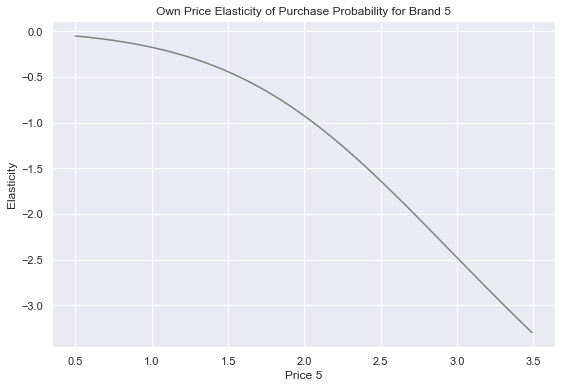

In [60]:
# Plot elasticities of purchase probability for brand 5.
plt.figure(figsize = (9, 6))
plt.plot(price_range, own_price_elasticity_brand_5, color = 'grey')
plt.xlabel('Price 5')
plt.ylabel('Elasticity')
plt.title('Own Price Elasticity of Purchase Probability for Brand 5')

<!-- Cross Price Elasticity Brand 5, Cross Brand 4 -->

# Cross Price Elasticity Brand 5, Cross Brand 4

In [61]:
# We want to examine the effect of the changes in price of a competitor brand.
# As we've discussed in the lecture, the brand which comes closest to our own brand is brand 4. 
# Therefore, we need to examine changes in the price of this brand.
# Keep in mind, we could examine the cross price elasticities for any of the remaining brands, 
# we just need to update this data frame accordingly to contain the respective brand.
df_brand5_cross_brand4 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4['Price_1'] = brand_choice['Price_1'].mean()
df_brand5_cross_brand4['Price_2'] = brand_choice['Price_2'].mean()
df_brand5_cross_brand4['Price_3'] = brand_choice['Price_3'].mean()
df_brand5_cross_brand4['Price_4'] = price_range
df_brand5_cross_brand4['Price_5'] = brand_choice['Price_5'].mean()

In [62]:
df_brand5_cross_brand4.head()

,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,0.50,2.654296
1,1.384559,1.764717,2.006694,0.51,2.654296
2,1.384559,1.764717,2.006694,0.52,2.654296
3,1.384559,1.764717,2.006694,0.53,2.654296
4,1.384559,1.764717,2.006694,0.54,2.654296


In [63]:
predict_brand5_cross_brand4 = model_brand_choice.predict_proba(df_brand5_cross_brand4)

In [64]:
# As now we're interested in what the probability of choosing the competitor brand is, 
# we need to select the purchase probability for brand 4, contained in the 4th column with index 3. 
pr_brand_4 = predict_brand5_cross_brand4[:][:, 3]

In [65]:
beta5

-1.09

In [66]:
# In order to calculate the cross brand price elasticity, we need to use the new formula we introduced in the lecture.
# The elasticity is equal to negative the price coefficient of the own brand multiplied by the price of the cross brand,
# further multiplied by the probability for choosing the cross brand.
brand5_cross_brand4_price_elasticity = -beta5 * price_range * pr_brand_4

In [67]:
# Update price elasticities data frame to include the cross price elasticities for brand 5 with respect to brand 4.
df_price_elasticities['Brand_5_Cross_Brand_4'] = brand5_cross_brand4_price_elasticity
df_price_elasticities

,Price Point,Mean_PE,PE_Segment_1,PE_segment_2,PE_segment_3,PE_segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4
0,0.50,-0.096396,-0.117620,-0.032893,-0.220208,-0.168011,-0.125724,-0.195634,-0.049055,0.332011
1,0.51,-0.100463,-0.121683,-0.034754,-0.227020,-0.172934,-0.129840,-0.201755,-0.050616,0.337287
2,0.52,-0.104658,-0.125833,-0.036704,-0.233943,-0.177928,-0.134035,-0.207979,-0.052207,0.342507
3,0.53,-0.108983,-0.130072,-0.038749,-0.240975,-0.182993,-0.138310,-0.214306,-0.053827,0.347668
4,0.54,-0.113442,-0.134402,-0.040892,-0.248119,-0.188129,-0.142665,-0.220737,-0.055477,0.352773
5,0.55,-0.118036,-0.138823,-0.043137,-0.255375,-0.193337,-0.147103,-0.227272,-0.057158,0.357820
6,0.56,-0.122771,-0.143337,-0.045490,-0.262743,-0.198617,-0.151624,-0.233914,-0.058871,0.362809
7,0.57,-0.127649,-0.147946,-0.047954,-0.270225,-0.203969,-0.156228,-0.240662,-0.060615,0.367741
8,0.58,-0.132674,-0.152650,-0.050535,-0.277820,-0.209395,-0.160917,-0.247517,-0.062391,0.372614
9,0.59,-0.137849,-0.157451,-0.053237,-0.285530,-0.214894,-0.165693,-0.254481,-0.064199,0.377429


Text(0.5, 1.0, 'Cross Price Elasticity of Brand 5 wrt Brand 4')

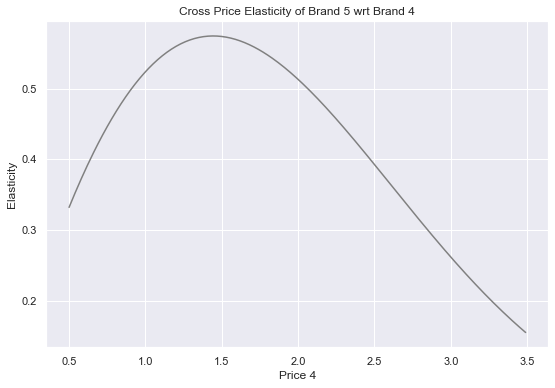

In [68]:
# Here we examine the cross price elasticity of purchase probability for brand 5 with respect to brand 4.
# We observe they are positive. As the price of the competitor brand increases, 
# so does the probability for purchasing our own brand.
# Even though the elasticity starts to decrease from the 1.45 mark, it is still positive, 
# signalling that the increase in purchase probability for the own brand happens more slowly.
plt.figure(figsize = (9, 6))
plt.plot(price_range, brand5_cross_brand4_price_elasticity, color = 'grey')
plt.xlabel('Price 4')
plt.ylabel('Elasticity')
plt.title('Cross Price Elasticity of Brand 5 wrt Brand 4')
# If CPE > 0 then 2 products are substitues
#  If CPE > OPE then competetitor is strong substutire


In [69]:
#Own and Cross-Price Elasticity by Segment
#  WELL-OFF

# We are interested in analysing the purchase probability for choosing brand 5 by segments.
# We filter our data to contain only purchase incidences of the third segment - Well-off.
brand_choice_s0 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s0 = brand_choice_s0[brand_choice_s0['Segment'] == 0]

pd.options.display.max_rows = 100
brand_choice_s0

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
101,200000002,6,1,4,1,0,0,1.59,1.87,2.01,...,52,2,159052,2,1,0,1,0,0,0
115,200000002,100,1,4,2,0,0,1.47,1.90,1.95,...,52,2,159052,2,1,0,1,0,0,0
138,200000002,283,1,4,3,0,0,1.37,1.89,2.00,...,52,2,159052,2,1,0,1,0,0,0
141,200000002,307,1,4,1,0,0,1.34,1.89,2.01,...,52,2,159052,2,1,0,1,0,0,0
153,200000002,422,1,4,1,0,0,1.34,1.89,2.02,...,52,2,159052,2,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57346,200000489,687,1,4,1,4,1,1.50,1.87,2.06,...,44,2,193816,2,1,0,1,0,0,0
57347,200000489,693,1,4,2,4,1,1.42,1.51,2.02,...,44,2,193816,2,1,0,1,0,0,0
57348,200000489,701,1,4,3,4,1,1.42,1.85,1.99,...,44,2,193816,2,1,0,1,0,0,0
57350,200000489,715,1,4,2,0,0,1.50,1.80,2.09,...,44,2,193816,2,1,0,1,0,0,0


In [70]:
Y = brand_choice_s0['Brand']
brand_choice_s0 = pd.get_dummies(brand_choice_s0 , columns = ['Brand'] , prefix = 'Brand' , prefix_sep = '_')
X = brand_choice_s0[features]
model_brand_choice_s0 = LogisticRegression(solver = 'sag' , multi_class = 'multinomial' , max_iter = 300)

model_brand_choice_s0.fit(X,Y)
# Coefficients table for segment 0

bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s0.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)
bc_coef

,Coef_Brand_1,Coef_Brand_2,Coef_Brand_3,Coef_Brand_4,Coef_Brand_5
Price_1,-2.15,1.33,0.82,0.12,-0.11
Price_2,-0.96,-1.38,1.29,0.78,0.27
Price_3,2.01,-1.65,-0.49,0.03,0.11
Price_4,2.52,0.96,-0.25,-1.90,-1.33
Price_5,-0.99,-0.30,1.17,0.56,-0.44


In [71]:
# Own-Brand Price Elasticity

In [72]:
# Calculating own-brand price elasticity for brand 5 and the Well-off segment.
df_own_brand_5_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_own_brand_5_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_own_brand_5_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_own_brand_5_s0['Price_4'] = brand_choice_s0['Price_4'].mean()
df_own_brand_5_s0['Price_5'] = price_range

predict_own_brand_5_s0 = model_brand_choice_s0.predict_proba(df_own_brand_5_s0)
pr_own_brand_5_s0 = predict_own_brand_5_s0[: ][: , 4]

own_price_elasticity_brand_5_s0 =  beta5 * price_range * (1 - pr_own_brand_5_s0)
df_price_elasticities['Brand 5 S0'] = own_price_elasticity_brand_5_s0

In [73]:
# Cross-Brand Price Elasticity

In [74]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Well-off segment.
df_brand5_cross_brand4_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_brand5_cross_brand4_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_brand5_cross_brand4_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_brand5_cross_brand4_s0['Price_4'] = price_range
df_brand5_cross_brand4_s0['Price_5'] = brand_choice_s0['Price_5'].mean()

predict_brand5_cross_brand4_s0 = model_brand_choice_s0.predict_proba(df_brand5_cross_brand4_s0)
pr_cross_brand_5_s0 = predict_brand5_cross_brand4_s0[: ][: , 3]

# Update master data frame to include the newly obtained cross-brand price elasticities.
brand5_cross_brand4_price_elasticity_s0 = -beta5 * price_range * pr_cross_brand_5_s0
df_price_elasticities['Brand_5_Cross_Brand_4_S0'] = brand5_cross_brand4_price_elasticity_s0
pd.options.display.max_rows = None
df_price_elasticities

,Price Point,Mean_PE,PE_Segment_1,PE_segment_2,PE_segment_3,PE_segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0
0,0.50,-0.096396,-0.117620,-0.032893,-0.220208,-0.168011,-0.125724,-0.195634,-0.049055,0.332011,-0.297309,0.482421
1,0.51,-0.100463,-0.121683,-0.034754,-0.227020,-0.172934,-0.129840,-0.201755,-0.050616,0.337287,-0.303355,0.491726
2,0.52,-0.104658,-0.125833,-0.036704,-0.233943,-0.177928,-0.134035,-0.207979,-0.052207,0.342507,-0.309411,0.501015
3,0.53,-0.108983,-0.130072,-0.038749,-0.240975,-0.182993,-0.138310,-0.214306,-0.053827,0.347668,-0.315478,0.510289
4,0.54,-0.113442,-0.134402,-0.040892,-0.248119,-0.188129,-0.142665,-0.220737,-0.055477,0.352773,-0.321556,0.519548
5,0.55,-0.118036,-0.138823,-0.043137,-0.255375,-0.193337,-0.147103,-0.227272,-0.057158,0.357820,-0.327646,0.528790
6,0.56,-0.122771,-0.143337,-0.045490,-0.262743,-0.198617,-0.151624,-0.233914,-0.058871,0.362809,-0.333747,0.538016
7,0.57,-0.127649,-0.147946,-0.047954,-0.270225,-0.203969,-0.156228,-0.240662,-0.060615,0.367741,-0.339861,0.547226
8,0.58,-0.132674,-0.152650,-0.050535,-0.277820,-0.209395,-0.160917,-0.247517,-0.062391,0.372614,-0.345987,0.556420
9,0.59,-0.137849,-0.157451,-0.053237,-0.285530,-0.214894,-0.165693,-0.254481,-0.064199,0.377429,-0.352126,0.565597


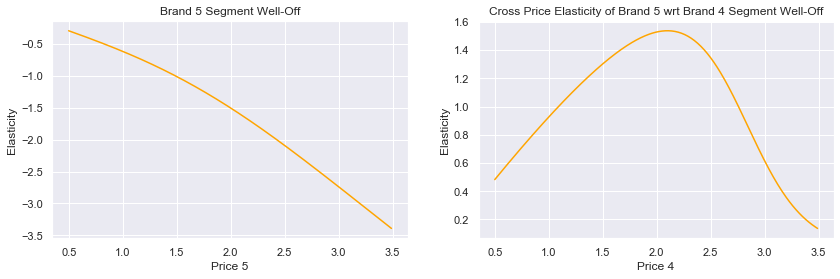

In [75]:
# Using a figure with axes we plot the own brand and cross-brand price elasticities for brand 5 cross brand 4 side by side.
fig, axs = plt.subplots(1, 2, figsize = (14, 4))
axs[0].plot(price_range, own_price_elasticity_brand_5_s0, color = 'orange')
axs[0].set_title('Brand 5 Segment Well-Off')
axs[0].set_xlabel('Price 5')

axs[1].plot(price_range, brand5_cross_brand4_price_elasticity_s0, color = 'orange')
axs[1].set_title('Cross Price Elasticity of Brand 5 wrt Brand 4 Segment Well-Off')
axs[1].set_xlabel('Price 4')

for ax in axs.flat:
    ax.set(ylabel = 'Elasticity')

In [76]:
# career foc

In [77]:
# Filter data by the Career-focused segment, which is the first segment.
brand_choice_s1 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s1 = brand_choice_s1[brand_choice_s1['Segment'] == 1]

In [78]:
# Brand Choice Model estimation.
Y = brand_choice_s1['Brand']
brand_choice_s1 = pd.get_dummies(brand_choice_s1, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s1[features]
model_brand_choice_s1 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s1.fit(X, Y)

# Coefficients table segment 1
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s1.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

In [79]:
# own brand PE

In [80]:
# Calculating own-brand price elasticity for brand 5 and the Career-focused segment.
df_own_brand_5_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_own_brand_5_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_own_brand_5_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_own_brand_5_s1['Price_4'] = brand_choice_s1['Price_4'].mean()
df_own_brand_5_s1['Price_5'] = price_range

predict_own_brand_5_s1 = model_brand_choice_s1.predict_proba(df_own_brand_5_s1)
pr_own_brand_5_s1 = predict_own_brand_5_s1[: ][: , 4]

#compute price elasticities and update data frame
own_price_elasticity_brand_5_s1 =  beta5 * price_range * (1 - pr_own_brand_5_s1)
df_price_elasticities.insert(12, column = 'Brand 5 S1', value = own_price_elasticity_brand_5_s1)

In [81]:
# Cross brand PE

In [82]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Career-focused segment.
df_brand5_cross_brand4_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_brand5_cross_brand4_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_brand5_cross_brand4_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_brand5_cross_brand4_s1['Price_4'] = price_range
df_brand5_cross_brand4_s1['Price_5'] = brand_choice_s1['Price_5'].mean()

predict_brand5_cross_brand4_s1 = model_brand_choice_s1.predict_proba(df_brand5_cross_brand4_s1)
pr_cross_brand_5_s1 = predict_brand5_cross_brand4_s1[: ][: , 3]

brand5_cross_brand4_price_elasticity_s1 = -beta5 * price_range * pr_cross_brand_5_s1
df_price_elasticities.insert(13, column = 'Brand_5_Cross_Brand_4_S1', value = brand5_cross_brand4_price_elasticity_s1)

In [83]:
#fewer oppur

In [84]:
# Filter data, select only purchases from segment 2, which is the Fewer-Opportunities segment.
brand_choice_s2 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s2 = brand_choice_s2[brand_choice_s2['Segment'] == 2]
brand_choice_s2.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,2,0,0,1,0
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,2,0,0,1,0
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,2,0,0,1,0
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,2,0,0,1,0
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,2,0,0,1,0


In [85]:
# Brand Choice Model estimation.
Y = brand_choice_s2['Brand']
brand_choice_s2 = pd.get_dummies(brand_choice_s2, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s2[features]
model_brand_choice_s2 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s2.fit(X, Y)

# Coefficients table segment 2
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s2.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

In [86]:
# own brand PE

In [87]:
# Calculating own-brand price elasticity for brand 5 and the Fewer-opportunities segment.
df_own_brand_5_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_own_brand_5_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_own_brand_5_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_own_brand_5_s2['Price_4'] = brand_choice_s2['Price_4'].mean()
df_own_brand_5_s2['Price_5'] = price_range

predict_own_brand_5_s2 = model_brand_choice_s2.predict_proba(df_own_brand_5_s2)
pr_own_brand_5_s2 = predict_own_brand_5_s2[: ][: , 4]

#compute price elasticities and update data frame
own_price_elasticity_brand_5_s2 =  beta5 * price_range * (1 - pr_own_brand_5_s2)
df_price_elasticities.insert(14, column = 'Brand 5 S2', value = own_price_elasticity_brand_5_s2)

In [88]:
# cross brand PE

In [89]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Fewer-opportunities segment.
df_brand5_cross_brand4_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_brand5_cross_brand4_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_brand5_cross_brand4_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_brand5_cross_brand4_s2['Price_4'] = price_range
df_brand5_cross_brand4_s2['Price_5'] = brand_choice_s2['Price_5'].mean()

predict_brand5_cross_brand4_s2 = model_brand_choice_s2.predict_proba(df_brand5_cross_brand4_s2)
pr_cross_brand_5_s2 = predict_brand5_cross_brand4_s2[: ][: , 3]

brand5_cross_brand4_price_elasticity_s2 = -beta5 * price_range * pr_cross_brand_5_s2
df_price_elasticities.insert(15, column = 'Brand_5_Cross_Brand_4_S2', value = brand5_cross_brand4_price_elasticity_s2)
df_price_elasticities

,Price Point,Mean_PE,PE_Segment_1,PE_segment_2,PE_segment_3,PE_segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2
0,0.50,-0.096396,-0.117620,-0.032893,-0.220208,-0.168011,-0.125724,-0.195634,-0.049055,0.332011,-0.297309,0.482421,-0.050919,0.196705,-0.000818,0.156808
1,0.51,-0.100463,-0.121683,-0.034754,-0.227020,-0.172934,-0.129840,-0.201755,-0.050616,0.337287,-0.303355,0.491726,-0.052061,0.199183,-0.000868,0.158897
2,0.52,-0.104658,-0.125833,-0.036704,-0.233943,-0.177928,-0.134035,-0.207979,-0.052207,0.342507,-0.309411,0.501015,-0.053210,0.201607,-0.000920,0.160947
3,0.53,-0.108983,-0.130072,-0.038749,-0.240975,-0.182993,-0.138310,-0.214306,-0.053827,0.347668,-0.315478,0.510289,-0.054363,0.203980,-0.000975,0.162959
4,0.54,-0.113442,-0.134402,-0.040892,-0.248119,-0.188129,-0.142665,-0.220737,-0.055477,0.352773,-0.321556,0.519548,-0.055523,0.206300,-0.001033,0.164933
5,0.55,-0.118036,-0.138823,-0.043137,-0.255375,-0.193337,-0.147103,-0.227272,-0.057158,0.357820,-0.327646,0.528790,-0.056688,0.208569,-0.001094,0.166869
6,0.56,-0.122771,-0.143337,-0.045490,-0.262743,-0.198617,-0.151624,-0.233914,-0.058871,0.362809,-0.333747,0.538016,-0.057859,0.210787,-0.001159,0.168768
7,0.57,-0.127649,-0.147946,-0.047954,-0.270225,-0.203969,-0.156228,-0.240662,-0.060615,0.367741,-0.339861,0.547226,-0.059036,0.212954,-0.001227,0.170630
8,0.58,-0.132674,-0.152650,-0.050535,-0.277820,-0.209395,-0.160917,-0.247517,-0.062391,0.372614,-0.345987,0.556420,-0.060219,0.215071,-0.001298,0.172454
9,0.59,-0.137849,-0.157451,-0.053237,-0.285530,-0.214894,-0.165693,-0.254481,-0.064199,0.377429,-0.352126,0.565597,-0.061408,0.217137,-0.001373,0.174242


In [90]:
# standard

In [91]:
# Here we are interesting in analysing the brand choice probability of the Standard segment.
# We filter our data, by selecting only purchases from segment 0.
brand_choice_s3 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s3 = brand_choice_s3[brand_choice_s3['Segment'] == 3]
brand_choice_s3.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
2398,200000024,44,1,2,2,0,0,1.35,1.58,1.97,...,32,1,88428,0,0,3,0,0,0,1
2403,200000024,98,1,2,2,0,0,1.47,1.90,1.95,...,32,1,88428,0,0,3,0,0,0,1
2408,200000024,143,1,2,3,0,0,1.21,1.35,1.99,...,32,1,88428,0,0,3,0,0,0,1
2410,200000024,162,1,2,5,0,0,1.39,1.90,1.94,...,32,1,88428,0,0,3,0,0,0,1
2417,200000024,217,1,5,1,0,0,1.34,1.89,1.99,...,32,1,88428,0,0,3,0,0,0,1


In [92]:
# Brand Choice Model estimation.
Y = brand_choice_s3['Brand']
brand_choice_s3 = pd.get_dummies(brand_choice_s3, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s3[features]
model_brand_choice_s3 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s3.fit(X, Y)

# Coefficients table segment 3.
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s3.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

In [94]:
# Calculating own-brand price elasticity for brand 5 and the Standard segment.
df_own_brand_5_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_own_brand_5_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_own_brand_5_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_own_brand_5_s3['Price_4'] = brand_choice_s3['Price_4'].mean()
df_own_brand_5_s3['Price_5'] = price_range

predict_own_brand_5_s3 = model_brand_choice_s3.predict_proba(df_own_brand_5_s3)
pr_own_brand_5_s3 = predict_own_brand_5_s3[: ][: , 4]

# Compute price elasticities and update master data frame.
# We'd like to include the elasticities for the segments in order from 0 to three, which is why we use insert() on position 10.
own_price_elasticity_brand_5_s3 =  beta5 * price_range * (1 - pr_own_brand_5_s3)
df_price_elasticities.insert(10, column = 'Brand 5 S3', value = own_price_elasticity_brand_5_s3)

In [95]:
# cross bran PE
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Standard segment.
df_brand5_cross_brand4_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_brand5_cross_brand4_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_brand5_cross_brand4_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_brand5_cross_brand4_s3['Price_4'] = price_range
df_brand5_cross_brand4_s3['Price_5'] = brand_choice_s3['Price_5'].mean()

predict_brand5_cross_brand4_s3 = model_brand_choice_s3.predict_proba(df_brand5_cross_brand4_s3)
pr_cross_brand_5_s3 = predict_brand5_cross_brand4_s3[: ][: , 3]

# Compute price elasticities and update master data frame.
# We need to use insert() on position 11, to save the price elasticities in the correct order.
brand5_cross_brand4_price_elasticity_s3 = -beta5 * price_range * pr_cross_brand_5_s3
df_price_elasticities.insert(11, column = 'Brand_5_Cross_Brand_4_S3', value = brand5_cross_brand4_price_elasticity_s3)

Text(0.5, 0, 'Price 4')

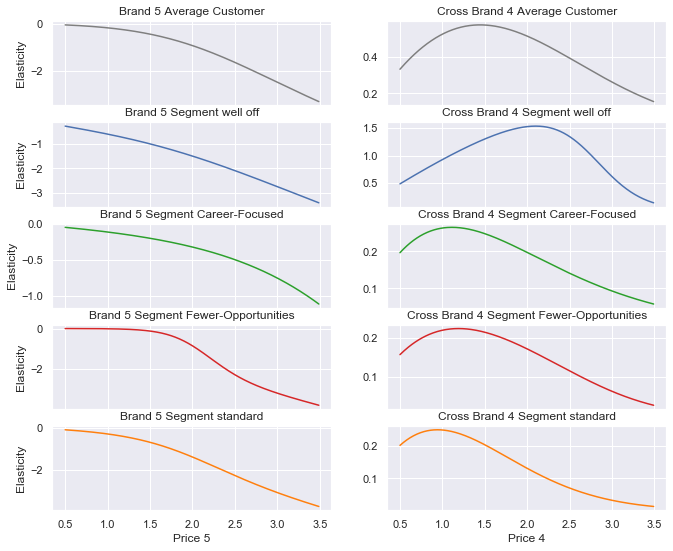

In [96]:
# We plot the own and cross brand price elasticities for the average customer and each of the four segments.
# We can observe differences and similiraties between the segments and examine their preference, when it comes to brand choice.
# The two segments, which seem to be of most interested for the marketing team of brand 5, seem to be the Career-focused
# and the Well-off. They are also the segments which purchase this brand most often. 
# The Career-focused segment is the most inelastic and they are the most loyal segment. 
# Based on our model, they do not seem to be that affected by price, therefore brand 5 could increase its price, 
# without fear of significant loss of customers from this segment. 
# The Well-off segment on the other hand, seems to be more elastic. They also purchase the competitor brand 4 most often.
# In order to target this segment, our analysis signals, that price needs to be decreased. However, keep in mind 
# that other factors aside from price might be influencing the purchase behaivour of this segment.
fig1, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 2, figsize = (11, 9), sharex = True)
ax1[0].plot(price_range, own_price_elasticity_brand_5, 'tab:grey')
ax1[0].set_title('Brand 5 Average Customer')
ax1[0].set_ylabel('Elasticity')
ax1[1].plot(price_range, brand5_cross_brand4_price_elasticity, 'tab:grey')
ax1[1].set_title('Cross Brand 4 Average Customer')


ax2[0].plot(price_range, own_price_elasticity_brand_5_s0)
ax2[0].set_title('Brand 5 Segment well off')
ax2[0].set_ylabel('Elasticity')
ax2[1].plot(price_range, brand5_cross_brand4_price_elasticity_s0)
ax2[1].set_title('Cross Brand 4 Segment well off')

ax3[0].plot(price_range, own_price_elasticity_brand_5_s1, 'tab:green')
ax3[0].set_title('Brand 5 Segment Career-Focused')
ax3[0].set_ylabel('Elasticity')
ax3[1].plot(price_range, brand5_cross_brand4_price_elasticity_s1, 'tab:green')
ax3[1].set_title('Cross Brand 4 Segment Career-Focused')

ax4[0].plot(price_range, own_price_elasticity_brand_5_s2, 'tab:red')
ax4[0].set_title('Brand 5 Segment Fewer-Opportunities')
ax4[0].set_ylabel('Elasticity')
ax4[1].plot(price_range, brand5_cross_brand4_price_elasticity_s2, 'tab:red')
ax4[1].set_title('Cross Brand 4 Segment Fewer-Opportunities')

ax5[0].plot(price_range, own_price_elasticity_brand_5_s3, 'tab:orange')
ax5[0].set_title('Brand 5 Segment standard')
ax5[0].set_xlabel('Price 5')
ax5[0].set_ylabel('Elasticity')
ax5[1].plot(price_range, brand5_cross_brand4_price_elasticity_s3, 'tab:orange')
ax5[1].set_title('Cross Brand 4 Segment standard')
ax5[1].set_xlabel('Price 4')